- reading from _source_ (input direction)
- write to various _destinations_ (output direction)
- information can be transfered through interconnected streams (_pipes_)

source | pipe 1 | pipe 2 | destination

- streams can be categorized by
    - type of data (e.g. binary or text)
    - direction (input or output)
    - type of source or destination to which the stream is connected
    - additional information like filtering
    
- possible sources or destinations
    - files
    - network sockets
    - console
    - memory
    - ...

- in `java.io` and `java.nio` packages
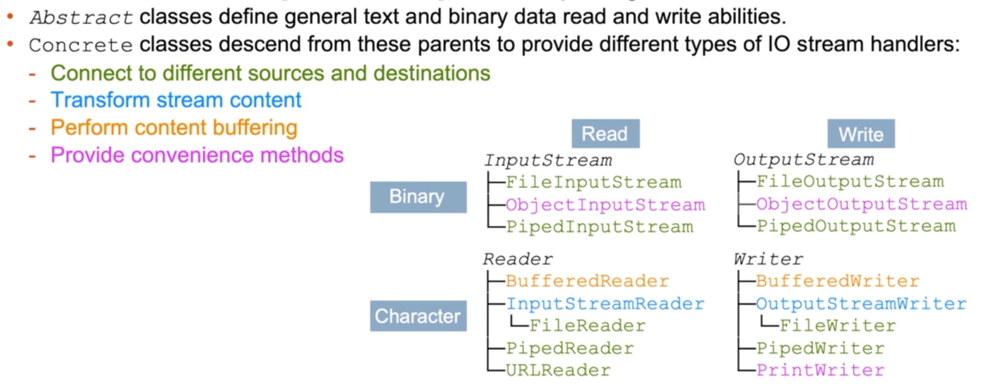

- deciding for a stream
    - which data (binary/ character)
    - which direction (read/ write)
    - which features (e.g. transformation)
- most input classes have corresponding output classes
- low-level streams connect directly with the source of data
- high-level streams take an other stream as input
- `Buffered` streams read bytes in groups instead of single bytes -> significant performance gain 
- with a few exceptions you only wrap a stream with another stream if they share the same parent

|Class Name             |Low/High Level | Description                            |      
|-----------------------|---------------|----------------------------------------|
|FileInputStream  |Low | Reads file data as bytes    |
|FileOutputStream | Low | Writes file data as bytes|
|FileReader       |Low | Reads file data as characters|
|FileWriter       |Low |Writes file data as characters   |
|BufferedInputStream | High |Reads byte data from an existing InputStream in a buffered manner, which improves efficiency and performance |
|BufferedOutputStream | High| Writes byte data to an existing OutputStream in a buffered manner, which improves efficiency and performance  |
|BufferedReader | High| Reads character data from an existing Reader in a buffered manner, which improves efficiency and performance  |
|BufferedWriter | High | Writes character data to an existing Writer in a buffered manner, which improves efficiency and performance  |
|ObjectInputStream | High| Deserializes primitive Java data types and graphs of Java objects from an existing InputStream |   
|ObjectOutputStream | High |Serializes primitive Java data types and graphs of Java objects to an existing OutputStream  |
|PrintStream  |High |Writes formatted representations of Java objects to a binary stream |
|PrintWriter | High| Writes formatted representations of Java objects to a character stream |


## Reading / Writing Binary Data
- reading / writing capability provided by 2 abstract classes
- `AutoClosable`  (resource closed in the implicit finally block)

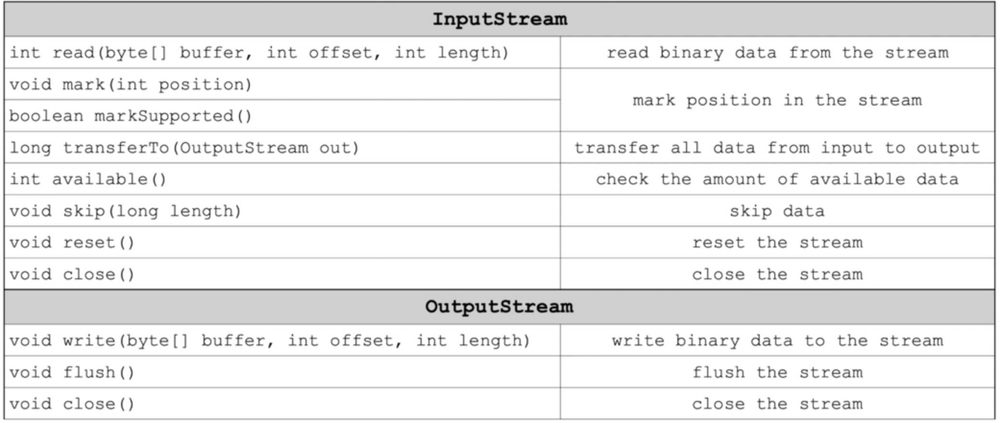

- flush 
    - push data through the stream
    - happens automatically when stream is closed 
    - handy for intermidate "pushing all data over the wire"

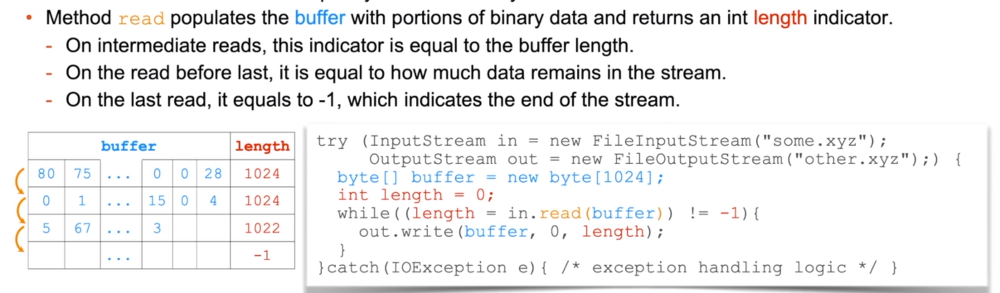

In [1]:
import java.io.*;
import java.nio.*;
import java.nio.charset.*;
import java.nio.file.*;

In [2]:
byte[] inputData = "hello\nworld".getBytes();
String path = "/tmp/out.txt";

try (InputStream in = new ByteArrayInputStream(inputData);
    OutputStream out = new FileOutputStream(path);) {
    
    byte[] buffer = new byte[1024];
    int length = 0;
    while((length = in.read(buffer)) != -1 ) {
        out.write(buffer, 0, length);
    }
}

In [3]:
Files.readString(Paths.get("/tmp/out.txt"))

hello
world

## Reading / Writing Character Data
- encoding is important (how long is a character?)
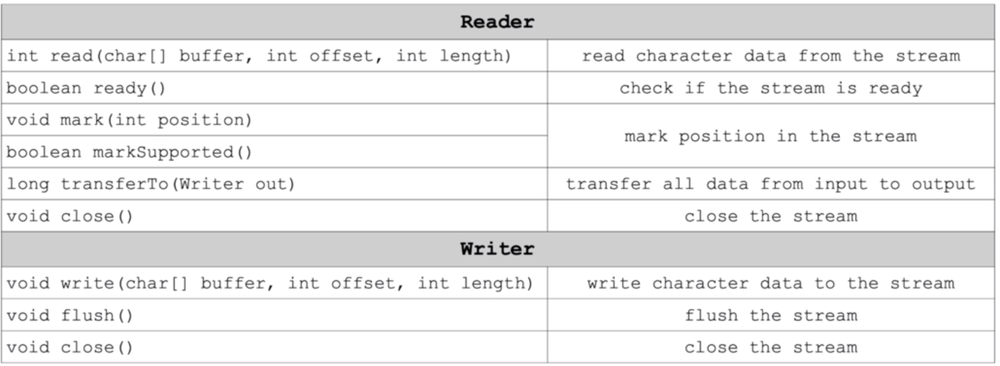

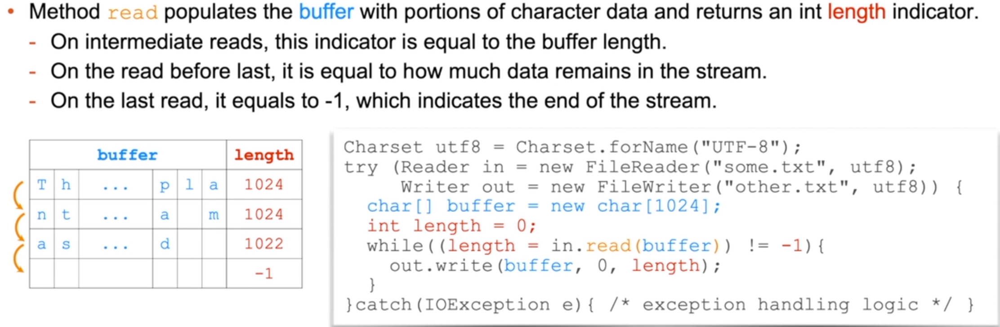

## Connecting Streams

In [4]:
Files.writeString(Path.of("/tmp/t1.txt"), "hello world", StandardOpenOption.CREATE);

/tmp/t1.txt

In [5]:
Charset utf8 = Charset.forName("UTF-8");
try ( 
    BufferedReader in =
    new BufferedReader(new InputStreamReader(new FileInputStream("/tmp/t1.txt"), utf8));
    PrintWriter out =  
      new PrintWriter(new OutputStreamWriter(new FileOutputStream("/tmp/out1.txt"), utf8));) {

    String line = null;
    while( (line = in.readLine()) != null ) {
        out.println(line);
    }
}

In [6]:
Files.readString(Path.of("/tmp/out1.txt"))

hello world


- `close()` only needs to be called on the outer most (high level) stream, here
    - `Bufferedreader` and
    - `PrintWriter`
- hence, the nesting is possible

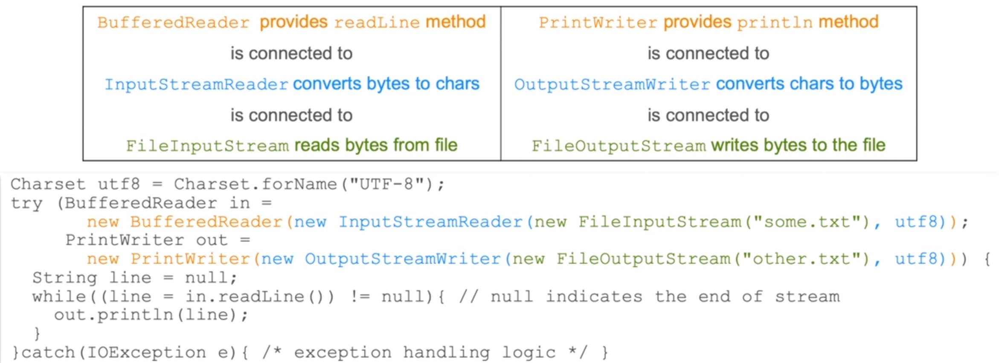

## Alternative Way To Obtain a FileOutputStream

In [46]:
import java.util.stream.*;    

In [53]:
Charset utf8 = Charset.forName("UTF-8");

try (PrintWriter out = new PrintWriter(
    new OutputStreamWriter(
        // alternative way to create output stream
        Files.newOutputStream(Path.of("/tmp/out2.txt"), StandardOpenOption.CREATE)))) {

    IntStream.rangeClosed(1, 10)
        .boxed()
        .map(it -> String.valueOf(it) + System.lineSeparator())
        .forEach(out::append);
}

Files.readString(Path.of("/tmp/out2.txt"));

1
2
3
4
5
6
7
8
9
10


## mark and reset
- `mark` stream position and jump back on `reset`

In [65]:
String input = "ABC";

// Buffered stream adds 'mark' support
var in = new BufferedInputStream(new StringBufferInputStream(input));
System.out.println((char)in.read());

// set marker
// '100' is the read limit in bytes. if exceeded an exception is thrown
in.mark(100);  
System.out.println((char)in.read());
System.out.println((char)in.read());
in.reset();   // reset to before mark

System.out.println((char)in.read() + " after reset");
System.out.println((char)in.read() + " after reset");

A
B
C
B after reset
C after reset


## skip
- `skip` n bytes in the stream

In [67]:
var in = new StringBufferInputStream("ABCDE");
in.skip(2);
System.out.println((char)in.read());
System.out.println((char)in.read());

C
D


## STDIN STDOUT
- don't overuse
- provide sequential access to resources -> might slow down program


| Constant name  |  Referenced class  | Action |
|----------------|--------------------|---------|
| `System.in`    |  `InputStream`     | read STDIN |
| `System.out`   |  `PrintStream`     | write STDOUT |
| `System.err`   |  `PrintStream`     | write STDERR |


### java.io.InputStream
_This abstract class is the superclass of all classes representing an input stream of bytes._

### java.io.PrintStream
_A PrintStream adds functionality to another output stream, namely the ability to print
representations of various data values conveniently.Two other features are provided as well.
Unlike other output streams, a PrintStream never throws an IOException_


In [9]:
System.err.println("muh")

muh


## Scanner
_A simple text scanner which can parse primitive types and strings using regular expressions.
A Scanner breaks its input into tokens using a delimiter pattern, which by default matches
whitespace._

In [10]:
String input = "ab\ncd\nef";
Scanner s = new Scanner(input);

while (s.hasNextLine()) {
    System.out.println(s.nextLine());
}
s.close();


ab
cd
ef


- alternative is `java.io.Console` - but not always available

# Serialization
- a memory dump
- _serialisation_ - writing objects from memory into a stream
- _deserialisation_ - read objects from stream
- data is serialized in binary format


- serialization not suitable for long-term storage 
    - serialized value is specific to compiled code version
    - new shape of object will not be compatible with old shape

<img src=attachment:image.png width=400></img>
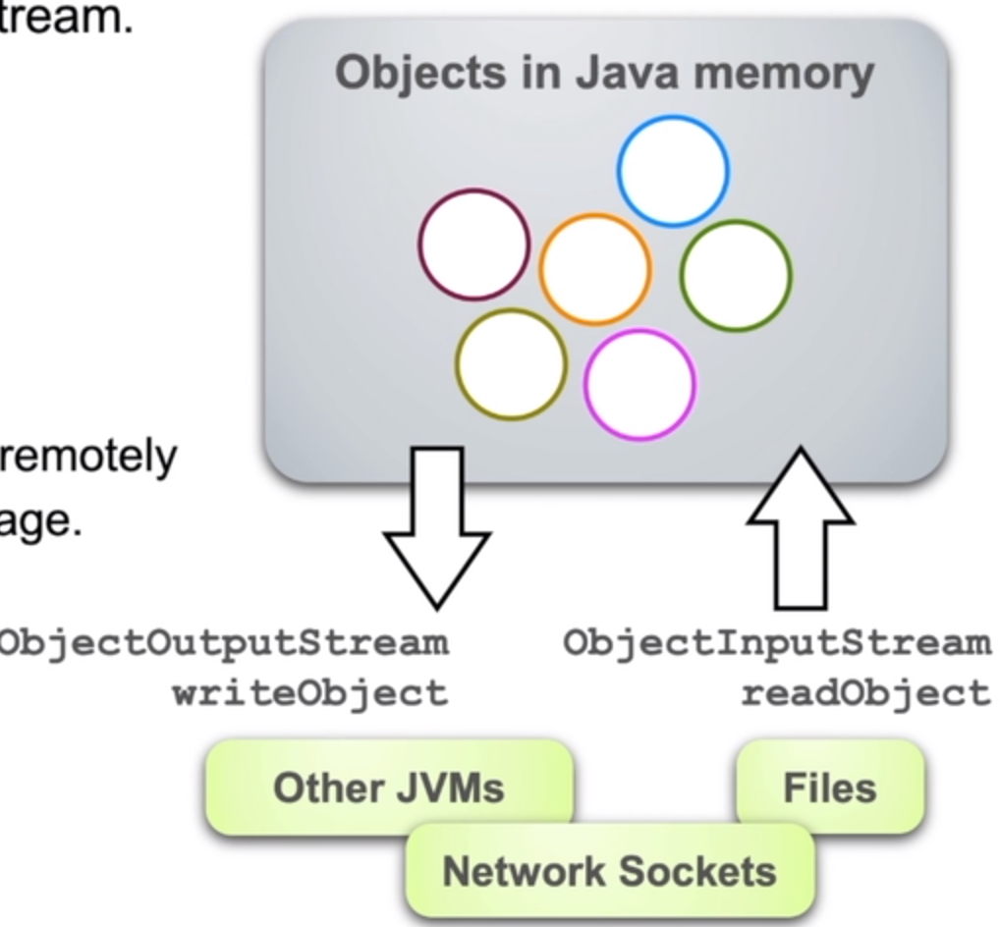

## Serialize Object Graph
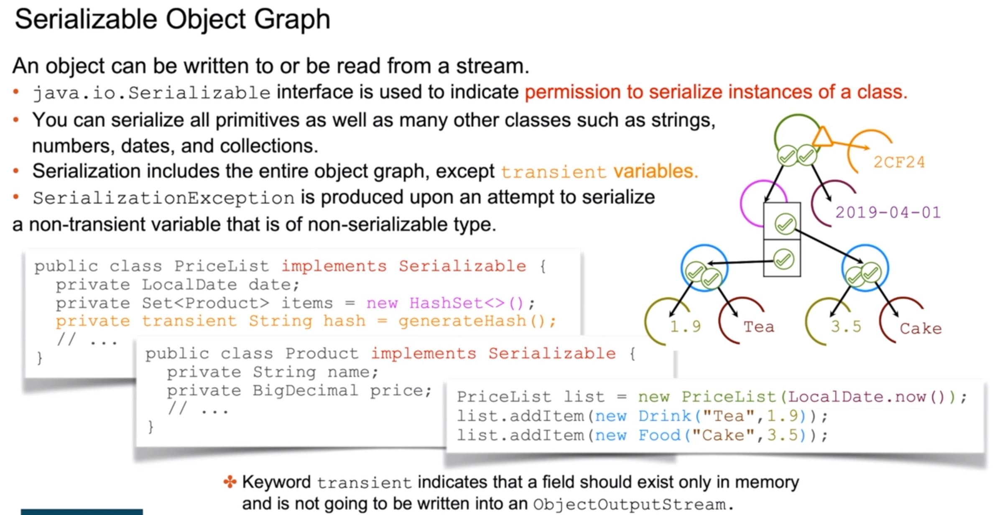

- `Serializible` is a marker interface
- ignored fields 
    - `transient`
    - `static`

In [11]:
class Product implements Serializable {
    public int id;
    public String name;
    
    public Product(int id, String name) {
        this.id = id;
        this.name = name;
    }
    
    public String toString() {return id + " " + name;}
}

In [12]:
class ProductList implements Serializable {

    private static final long serialVersionUID = 1L;

    public List<Product> products = new ArrayList<>();
    public boolean addItem(Product product) {
        return products.add(product);
    }
    
    // optional method for pre/ post processing the serialization
    private void writeObject(ObjectOutputStream out) throws IOException {
        System.out.println("pre-processing serialization");
        out.defaultWriteObject();
        System.out.println("post-processing serialization");
    }
    
    // same for deserialization side, optionally allows further processing
    //private void readObject(ObjectInputStream in) {...}
    
    public String toString() {return products.toString();}
}

In [13]:
var productList= new ProductList();
productList.addItem(new Product(1, "foo"));
productList.addItem(new Product(2, "bar"));

true

In [14]:
// serialzation
try (ObjectOutputStream out = new ObjectOutputStream(new FileOutputStream("/tmp/swap"))) {
    out.writeObject(productList);
}

pre-processing serialization
post-processing serialization


In [15]:
Files.size(Paths.get("/tmp/swap"));

232

In [16]:
// de-serialization
ProductList productList2;
try (ObjectInputStream in = new ObjectInputStream(new FileInputStream("/tmp/swap"))) {
    // cast fails - seems to be a jshell issue
    productList2 = (ProductList)in.readObject();
}
productList2

[1 foo, 2 bar]

## Deserialization
- construtor of the serialized class is _not_ called when object is create
- Java will call the no-arg constructor of the first nonserializable parent class it can find in the class hierarchy.
- this can be also _Object_


## Versioning
- serialization not suitable for long-term storage
- modified class defenition when
    - source code changes
    - class is recompiled with different JDK
- mismatch of class definition could cause unpreditable program behaviour
- `ObjectInputStream` checks `serialVersionUID` indicator 
- ensures that class definition used is same as class definition used by Java runtime at time object was serialized
- throws `InvalidClassException` on mismatch
- ! version number needs to be manually incremented when code changes !

<img src=attachment:image.png width=600></img>
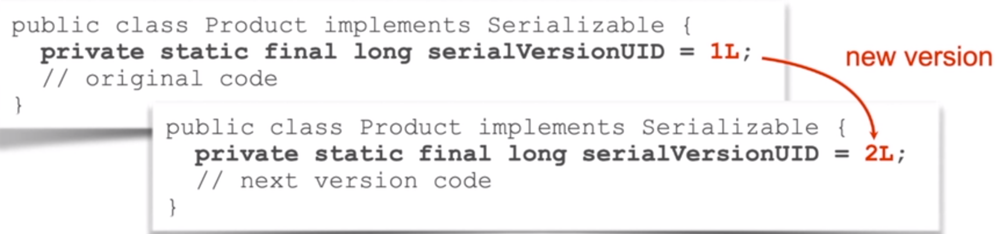

In [17]:
class ProductList {
    private static final long serialVersionUID = 2L;
    
    public List<Product> products = new ArrayList<>();
    public boolean addItem(Product product) {
        return products.add(product);
    }
    
    // optional method for pre/ post processing the serialization
    private void writeObject(ObjectOutputStream out) throws IOException {
        System.out.println("pre-processing serialization");
        out.defaultWriteObject();
        System.out.println("post-processing serialization");
    }
    
    // same for deserialization side, optionally allows further processing
    //private void readObject(ObjectInputStream in) {...}
    
    public String toString() {return products.toString();}
}

In [18]:
// not sure if this is the exception I would expect
try (ObjectInputStream in = new ObjectInputStream(new FileInputStream("/tmp/swap"))) {
    // cast fails - seems to be a jshell issue
    var productList4 = (ProductList)in.readObject();
}

EvalException: class REPL.$JShell$31$ProductList cannot be cast to class REPL.$JShell$31C$ProductList (REPL.$JShell$31$ProductList and REPL.$JShell$31C$ProductList are in unnamed module of loader jdk.jshell.execution.DefaultLoaderDelegate$RemoteClassLoader @7722c3c3)

# Working With Filesystems
- java.nio.file
    - `Path` 
        - represents files and folders
        - do not have to exist in the filesystem
    - `Files` - operations to handle path objects
    - `FileSystem` - describes a vailable filesystems and their properties
        - access properties of file stores using stream of FileStore objects
        - discover filesystem roots using stream of Path objects
        - get path not separator ("/" vs. "\")
- java.io.File
    - legacy API
    - functionality distributed between classes above

In [19]:
import java.nio.*;
import java.nio.file.*;

In [20]:
FileSystem fs = FileSystems.getDefault();
fs

sun.nio.fs.LinuxFileSystem@36b5bf85

In [21]:
fs.getSeparator()

/

In [22]:
fs.getFileStores().forEach(it -> System.out.println(it.type() + ' ' + it.name()));

overlay overlay
proc proc
tmpfs tmpfs
devpts devpts
sysfs sysfs
tmpfs tmpfs
cgroup cgroup
cgroup cgroup
cgroup cgroup
cgroup cgroup
cgroup cgroup
cgroup cgroup
cgroup cgroup
cgroup cgroup
cgroup cgroup
cgroup cgroup
cgroup cgroup
cgroup cgroup
mqueue mqueue
tmpfs shm
ext4 /dev/mapper/vgubuntu-root
ext4 /dev/mapper/vgubuntu-root
ext4 /dev/mapper/vgubuntu-root
ext4 /dev/mapper/vgubuntu-root
proc proc
proc proc
proc proc
proc proc
proc proc
tmpfs tmpfs
tmpfs tmpfs
tmpfs tmpfs
tmpfs tmpfs
tmpfs tmpfs
tmpfs tmpfs
tmpfs tmpfs
tmpfs tmpfs


In [23]:
fs.getRootDirectories().forEach(System.out::println)

/


## File <> Path

In [24]:
// legacy API
new File("/tmp/hello.txt").toPath()

/tmp/hello.txt

In [25]:
Path p = Path.of("/tmp/hello.txt");
p.toFile()

/tmp/hello.txt

## File
// TODO add some examples

## Path

## Constructing Filesystem Paths
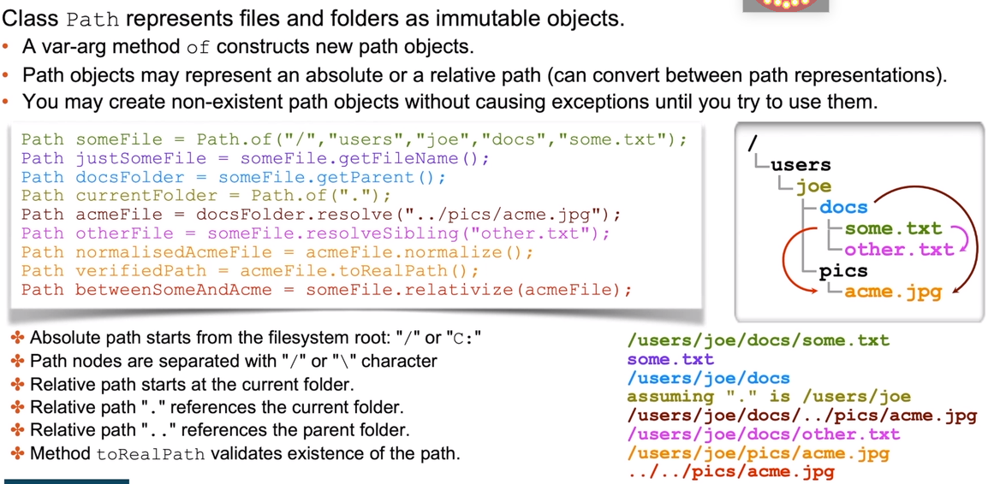

In [26]:
// toRealPath validates existence ("Does it exist")
Path.of("/tmp").toRealPath()

/tmp

In [27]:
Path.of("/not-existing").toRealPath()

EvalException: /not-existing

In [28]:
// normalize
var p = Path.of("/tmp/a/../b/c/../../d");
p

/tmp/a/../b/c/../../d

In [29]:
p.normalize()

/tmp/d

In [30]:
// relativize
var a = Path.of("/tmp/a/b/c");
var b = Path.of("/tmp/a/d/e");
// from path a's perspective the relative path to b
a.relativize(b)

../../d/e

## Navigating the Filesystem

In [31]:
var currentDir = Path.of("./");

// list folder content
// "list" returns a stream
Files.list(currentDir).forEach(System.out::println)

./.ipynb_checkpoints
./Content_and_Confidence.ipynb
./11_Streams_API.ipynb
./1-2_Intro_and_Operators.ipynb
./12_Handling_Exceptions_and_Fixing_Bugs.ipynb
./hello.txt
./tree
./8-Arrays_and_Loops.ipynb
./Playground.ipynb
./3-Text_Date_Time_Numeric_Objects.ipynb
./13_Java_IO_API.ipynb
./10_Nested_Classes_and_Lambda_Expressions.ipynb
./9-Collections.ipynb
./0_Exam_Details.ipynb
./7-Interfaces.ipynb
./4-Classes_and_Objects.ipynb
./test.zip


In [32]:
// walk down file system path
Files.walk(Path.of("/")).limit(10).forEach(System.out::println)

/
/var
/var/log
/var/log/dpkg.log
/var/log/tallylog
/var/log/apt
/var/log/apt/term.log
/var/log/apt/eipp.log.xz
/var/log/apt/history.log
/var/log/btmp


## Analyse Path Properties
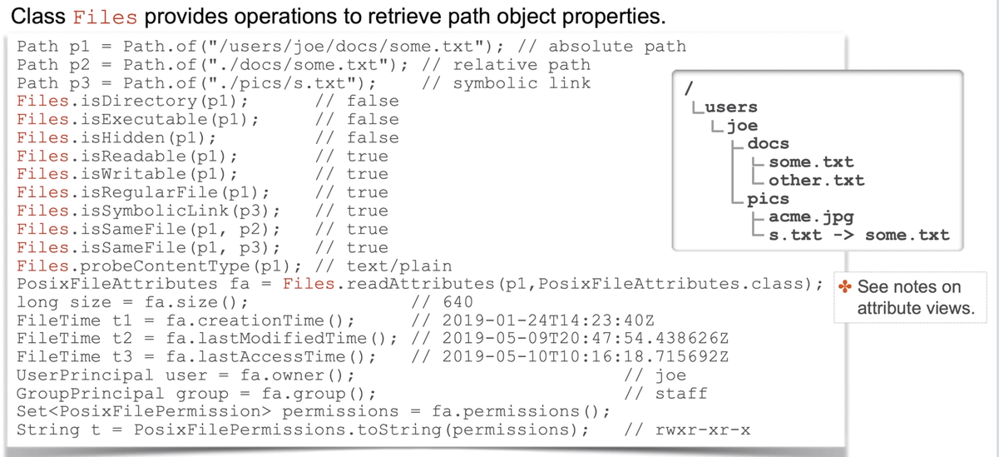

In [33]:
import java.nio.file.attribute.*;

Path h = Path.of("./hello.txt");
PosixFileAttributes fa = Files.readAttributes(h, PosixFileAttributes.class);
fa.creationTime();

2021-03-16T19:52:47.260769Z

In [34]:
PosixFilePermissions.toString(fa.permissions())

rw-rw-r--

## Create Paths

In [35]:
Path t = Path.of("/tmp", "a", "b", "c");
if (Files.notExists(t)) Files.createDirectories(t);

In [36]:
Files.walk(Path.of("/tmp/a")).forEach(System.out::println)

/tmp/a
/tmp/a/b
/tmp/a/b/c


In [37]:
Files.writeString(Path.of("/tmp/hi.txt"), "some content", StandardOpenOption.CREATE);

/tmp/hi.txt

In [38]:
Files.lines(Path.of("./hello.txt"), Charset.forName("UTF-8"))
    .forEach(System.out::println)

hello
world


## Deleting Directory Structure

In [39]:
Files.createDirectories(Path.of("/tmp/x/y/z"));
//Files.createFile(Path.of("/tmp/x/y/z/hello.txt"));

/tmp/x/y/z

In [40]:
Files.walk(Path.of("/tmp/x"))
    .sorted(Comparator.reverseOrder())  // go from inside to outside
    .peek(System.out::println)
    .forEach(path -> {
        try {
            Files.delete(path);
        } catch (IOException io) {
            System.out.println("Can't delete " + path);
        }
});

/tmp/x/y/z
/tmp/x/y
/tmp/x


In [41]:
/*  more compact:
    Files.walk(pathToBeDeleted)
      .sorted(Comparator.reverseOrder())
      .map(Path::toFile)
      .forEach(File::delete);
*/

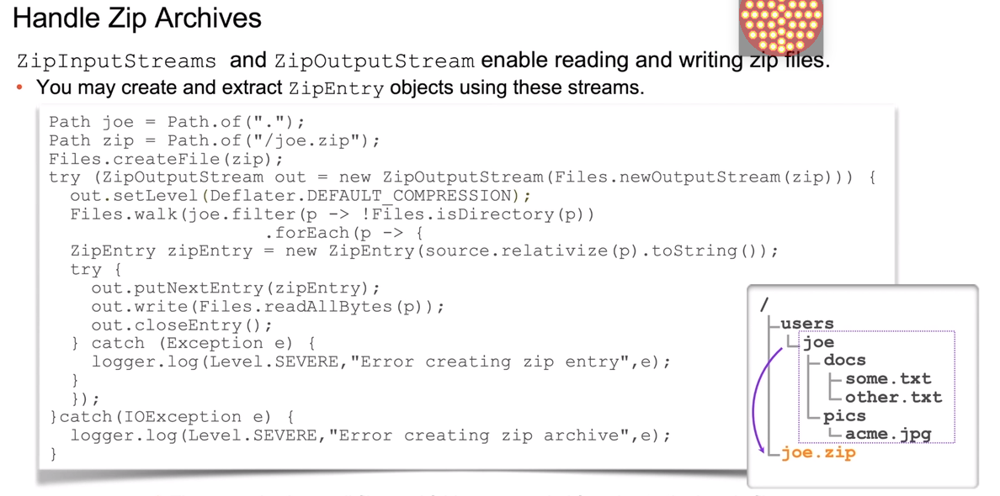

## Zip Archive as FileSystem
- note: `ZipFileSystem` does not support compression

In [42]:
Path archive = Path.of("./test.zip");  // exists in this directory
try (FileSystem fs = FileSystems.newFileSystem(archive, null))  { 
    System.out.println(fs.getFileStores());
    
}

[jdk.nio.zipfs.ZipFileStore@4d78f713]


In [43]:
try (FileSystem fs = FileSystems.newFileSystem(archive, null))  { 
    Files.list(fs.getPath("./")).forEach(System.out::println);    
}

./b
./a


## curl in Java

In [44]:
import java.net.*;
import java.net.http.*;

Path outputPath = Path.of("/tmp/out.txt");
URI uri = URI.create("http://localhost:8888/tree");

HttpRequest req = HttpRequest.newBuilder(uri).GET().build();
HttpClient client = HttpClient.newHttpClient();
HttpResponse<Path> res = client.send(req, HttpResponse.BodyHandlers.ofFile(outputPath));

In [45]:
Files.lines(Path.of("/tmp/out.txt"))
    .limit(10)
    .forEach(System.out::println)

<!DOCTYPE HTML>
<html>

<head>
    <meta charset="utf-8">

    <title>Home Page - Select or create a notebook</title>
    <link id="favicon" rel="shortcut icon" type="image/x-icon" href="/static/base/images/favicon.ico?v=50afa725b5de8b00030139d09b38620224d4e7dba47c07ef0e86d4643f30c9bfe6bb7e1a4a1c561aa32834480909a4b6fe7cd1e17f7159330b6b5914bf45a880">
    <meta http-equiv="X-UA-Compatible" content="IE=edge" />
    <link rel="stylesheet" href="/static/components/jquery-ui/themes/smoothness/jquery-ui.min.css?v=fb45616eef2c454960f91fcd2a04efeda84cfacccf0c5d741ba2793dc1dbd6d3ab01aaae6485222945774c7d7a9a2e9fb87e0d8ef1ea96893aa6906147a371bb" type="text/css" />
